### Import libraries

In [3]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

### Camera Calibration

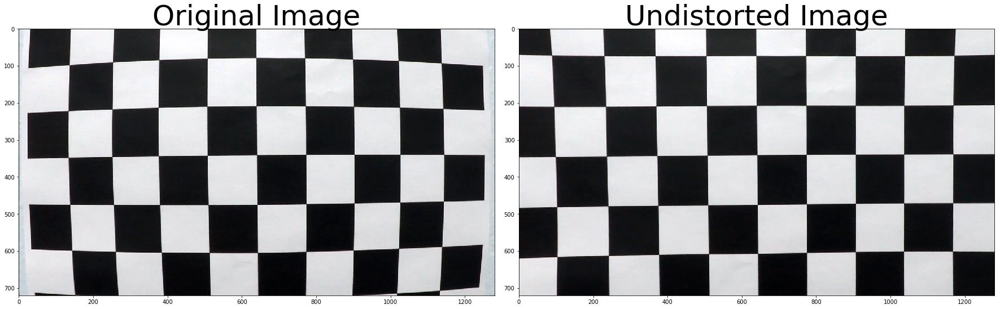

In [4]:
#Camera calibration

def calculate_camera_matrix_and_disturtion_coefficients(nx,ny,path):

    objpoints = []
    imgpoints = []
    images = glob.glob(path)

    
    objp = np.zeros((ny*nx,3),np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
    image_shape = None;

    for image in images:
        # Convert to grayscale
        img = cv2.imread(image)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        if image_shape == None:
            image_shape = gray.shape[::-1]
            
        # Find the chessboard corners
        ret,corners = cv2.findChessboardCorners(gray, (nx, ny), None)
       
    
        # If found, draw corners
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints,image_shape , None, None)
    return mtx, dist
    
    
path = '/Users/test/Desktop/SDCND/CarND-Advanced-Lane-Lines/camera_cal/calibration*.jpg'   
mtx, dist = calculate_camera_matrix_and_disturtion_coefficients(9,6,path)
img = cv2.imread('/Users/test/Desktop/SDCND/CarND-Advanced-Lane-Lines/camera_cal/calibration1.jpg')
undistorted = cv2.undistort(img, mtx, dist, None, mtx)


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 
f.savefig('./writeup_images/undistort_output.png')

   

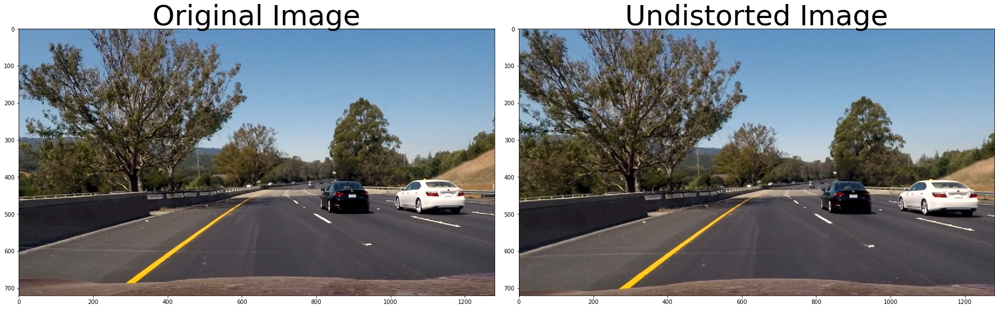

In [5]:
 
img = cv2.imread('/Users/test/Desktop/SDCND/CarND-Advanced-Lane-Lines/test_images/test6.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
undistorted = cv2.undistort(img, mtx, dist, None, mtx)


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 
f.savefig('./writeup_images/test6.jpg')

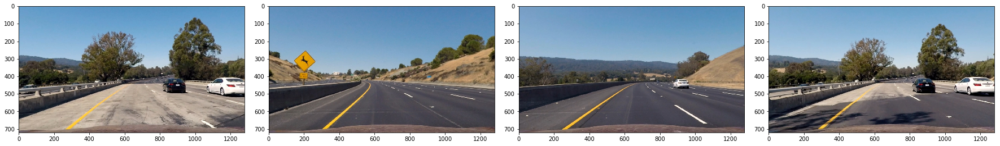

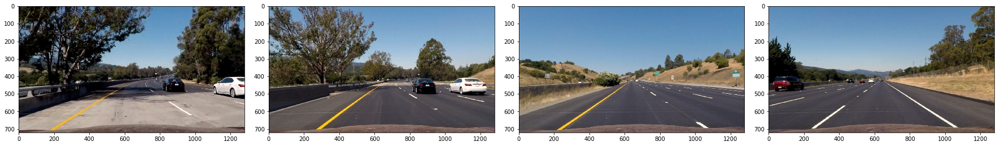

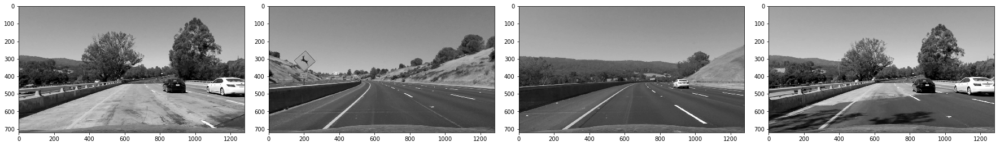

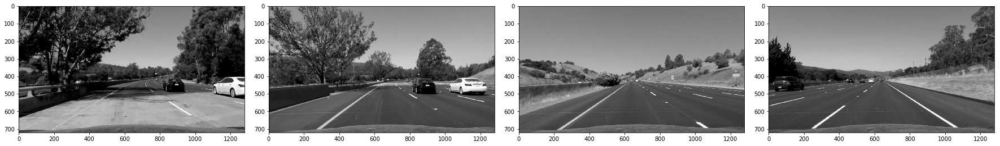

In [6]:
#load test images
test_imagenames = glob.glob('/Users/test/Desktop/SDCND/CarND-Advanced-Lane-Lines/test_images/test*.jpg') \
+ glob.glob('/Users/test/Desktop/SDCND/CarND-Advanced-Lane-Lines/test_images/straight_lines*.jpg')

test_images = []
test_images_gray = []

for name in test_imagenames:
   test_images.append(cv2.undistort(mpimg.imread(name), mtx, dist, None, mtx))

for image in test_images:
   test_images_gray.append(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY))
   
image_length = len(test_images) 

def show_plots(images,type):
    image_length = int(len(images)/2) 
    f, ax = plt.subplots(1, image_length, figsize=(24, 9))
    f.tight_layout()
    for i in range(0,image_length):
        if(type == "gray"):
            ax[i].imshow(images[i],cmap = "gray")
        else:
            ax[i].imshow(images[i])
        #ax[i].set_title( imagenames[i] , fontsize=5)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    f, ax = plt.subplots(1, image_length, figsize=(24, 9))
    f.tight_layout()
    ax1.set_title('Original Image', fontsize=50)
    for i in range(image_length,image_length*2):
        if(type == "gray"):
            ax[i-image_length].imshow(images[i],cmap = "gray")
        else:
            ax[i-image_length].imshow(images[i])
        #ax[i-image_length].set_title( imagenames[i] , fontsize=5)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
   
 

show_plots(test_images,None)
show_plots(test_images_gray,"gray")

### Color spaces, gradients exploration

In [7]:
threshold_min = 10
threshold_max = 150


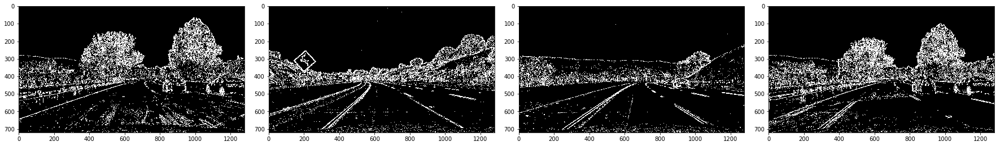

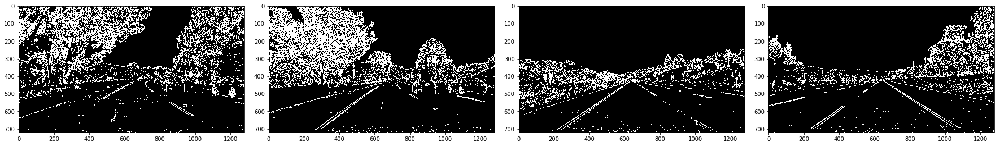

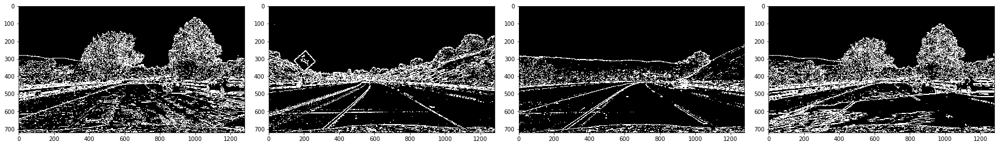

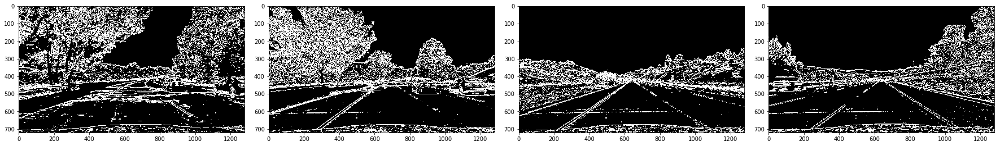

In [8]:

def getSobel(images,orient,threshold):
    sobel = None
    sobel_images = []
    for image in images:
       if(orient == 'y'):
           sobel = cv2.Sobel(image, cv2.CV_64F, 0, 1)
       else:
           sobel = cv2.Sobel(image, cv2.CV_64F, 1, 0)
       abs_sobel = np.absolute(sobel)
       scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
       sbinary = np.zeros_like(scaled_sobel)
       sbinary[(scaled_sobel >= threshold[0]) & (scaled_sobel <= threshold[1])] = 1
       sobel_images.append(sbinary)
    return sobel_images 
    
sobelx_images = getSobel(test_images_gray,'x',(threshold_min,threshold_max))
sobely_images = getSobel(test_images_gray,'y',(threshold_min,threshold_max))

show_plots(sobelx_images,"gray")
show_plots(sobely_images,"gray")

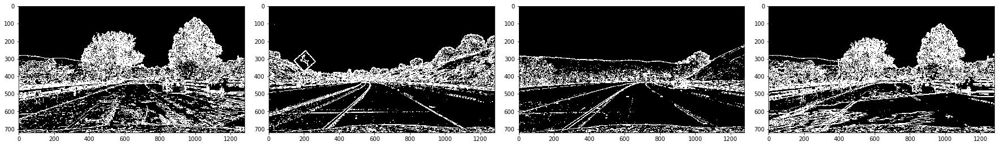

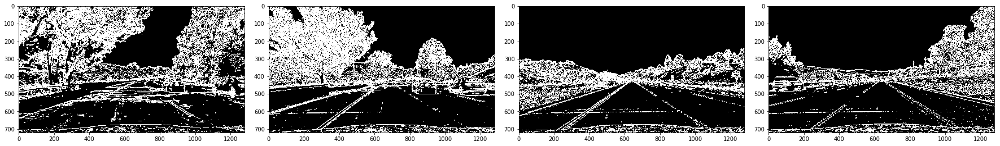

In [9]:
def mag_thresh(gray_images, sobel_kernel=3, mag_thresh=(0, 255)):
    images = []
    for i in range(0,len(gray_images)):
        sobelx = cv2.Sobel(gray_images[i], cv2.CV_64F, 1, 0,ksize=sobel_kernel)
        abs_sobelx = np.absolute(sobelx)
    
        sobely = cv2.Sobel(gray_images[i], cv2.CV_64F, 0, 1,ksize=sobel_kernel)
        abs_sobely = np.absolute(sobely)
       
        
        abs_sobelxy = np.sqrt(np.power(sobelx,2) + np.power(sobely,2))
        np.uint8(255*abs_sobelx/np.max(abs_sobelxy))
        scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
        binary_output = np.zeros_like(scaled_sobel)
        binary_output[(scaled_sobel>=mag_thresh[0]) & (scaled_sobel<=mag_thresh[1]) ] = 1
        images.append(binary_output)  
    return images  
    

mag_binary = mag_thresh(test_images_gray, sobel_kernel=3, mag_thresh=(threshold_min,threshold_max))
show_plots(mag_binary,"gray")

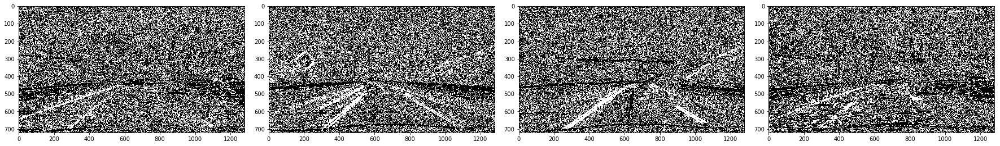

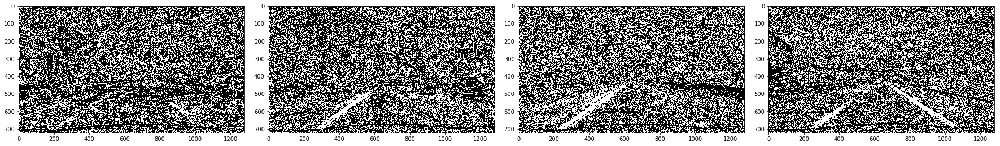

In [10]:
def dir_threshold(gray_images, sobel_kernel=3, thresh=(0, np.pi/2)):
    images = []
    for i in range(0,len(gray_images)):
        sobelx = cv2.Sobel(gray_images[i], cv2.CV_64F, 1, 0,ksize=sobel_kernel)
        abs_sobelx = np.absolute(sobelx)
    
        sobely = cv2.Sobel(gray_images[i], cv2.CV_64F, 0, 1,ksize=sobel_kernel)
        abs_sobely = np.absolute(sobely)
       
        
        abs_sobelxy = np.arctan2(abs_sobely, abs_sobelx)

        binary_output = np.zeros_like(abs_sobelxy)
        binary_output[(abs_sobelxy>=thresh[0]) & (abs_sobelxy<=thresh[1]) ] = 1
        images.append(binary_output)  
    return images
    
    
dir_binary = dir_threshold(test_images_gray, sobel_kernel=15, thresh=(0.7, 1.3))
show_plots(dir_binary,"gray")    

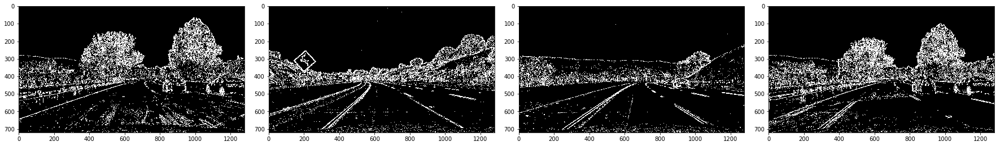

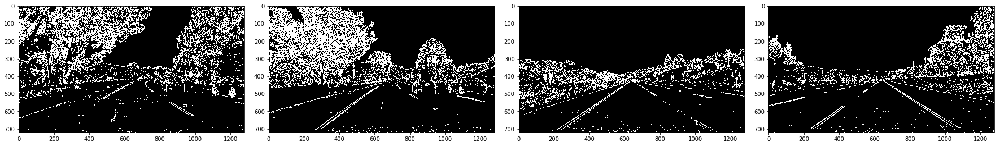

In [11]:

def get_combined(sobelx,dir_binary):
    images = []
    for i in range(0,len(sobelx)):
        image = np.zeros_like(sobelx[0])
        image[(sobelx[i] == 1) | (dir_binary == 1)] = 1
        images.append(image)
    return images    
    
combined = get_combined(sobelx_images,dir_binary)
show_plots(combined,"gray") 


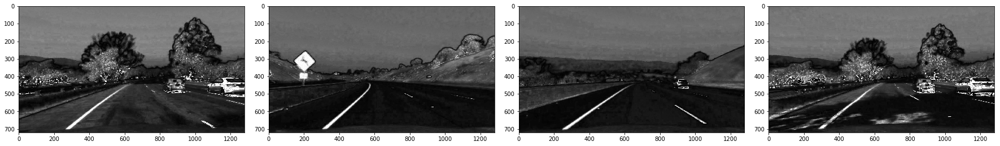

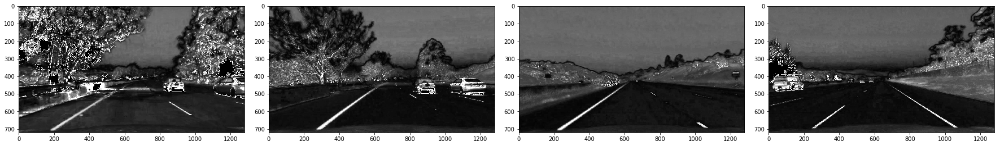

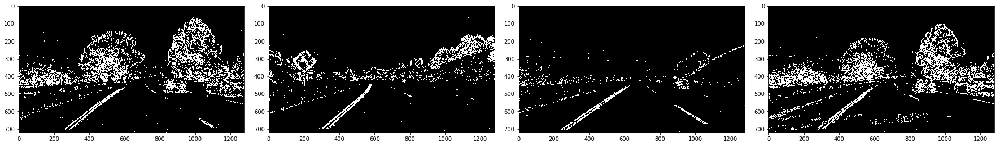

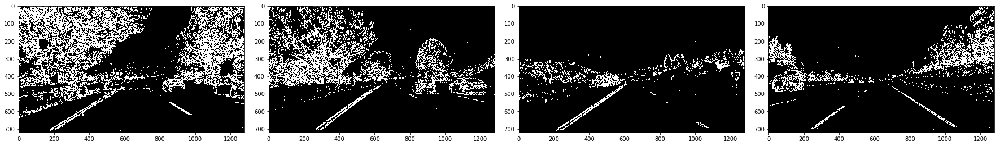

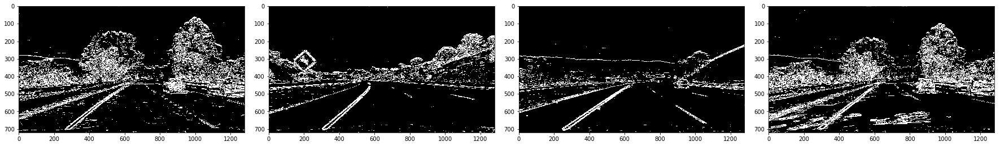

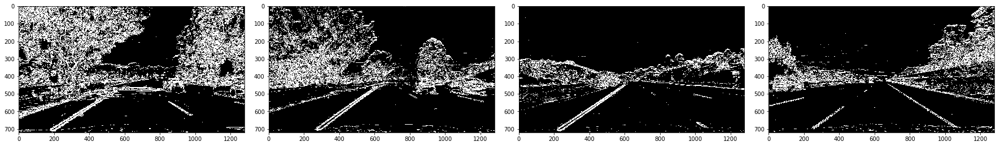

In [12]:
def get_s_channel(test_images):
    images = []
    for image in test_images:
       hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
       s = hls[:,:,2]
       images.append(s)
    return images  
    
s_channel_images = get_s_channel(test_images)  
    
show_plots(s_channel_images,"gray")

s_channel_sobelx_images = getSobel(s_channel_images,'x',(threshold_min,threshold_max))
s_channel_sobely_images = getSobel(s_channel_images,'y',(threshold_min,threshold_max))

show_plots(s_channel_sobelx_images,"gray")
show_plots(s_channel_sobely_images,"gray")

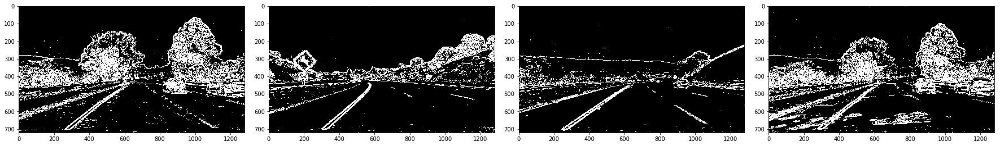

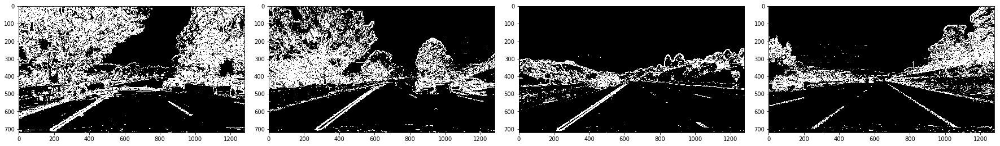

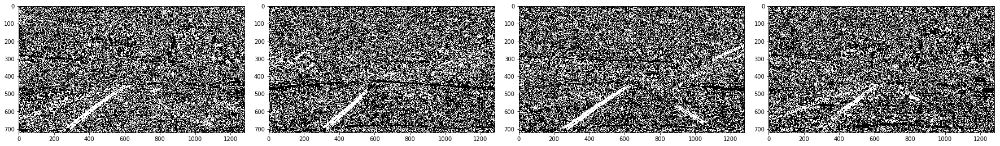

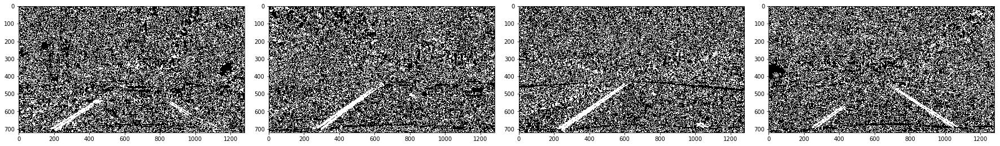

In [13]:
s_channel_mag_binary = mag_thresh(s_channel_images, sobel_kernel=3, mag_thresh=(threshold_min,threshold_max))
show_plots(s_channel_mag_binary,"gray")

s_channel_dir_binary = dir_threshold(s_channel_images, sobel_kernel=15, thresh=(0.7, 1.3))
show_plots(s_channel_dir_binary,"gray") 

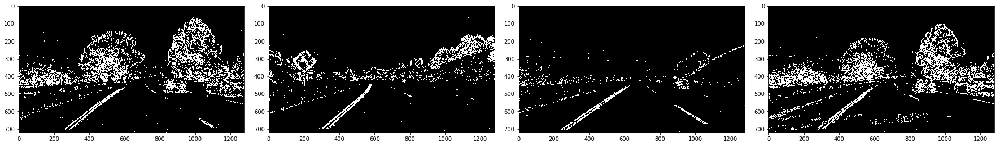

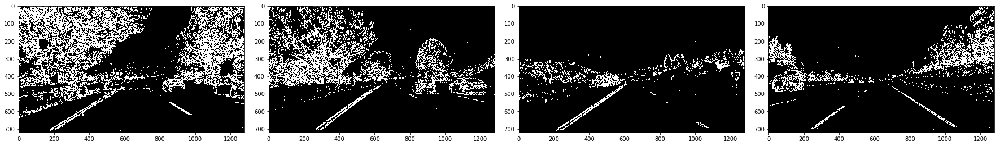

In [14]:
s_channel_combined = get_combined(s_channel_sobelx_images,s_channel_dir_binary)
show_plots(s_channel_combined,"gray") 

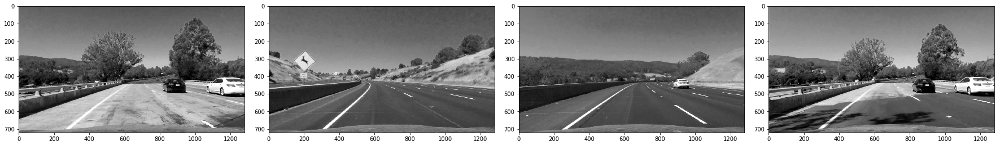

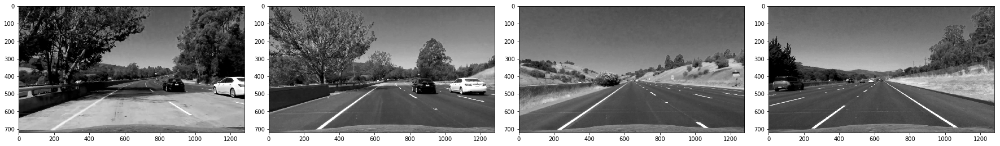

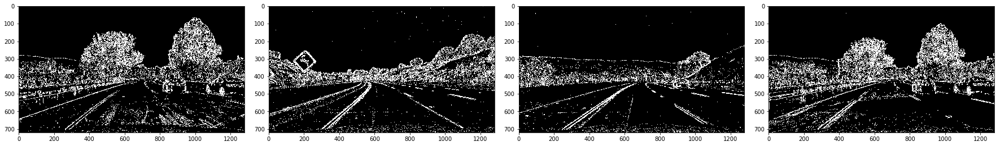

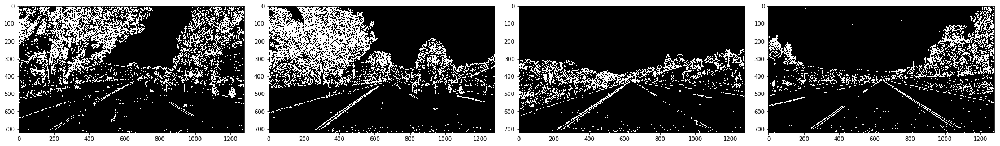

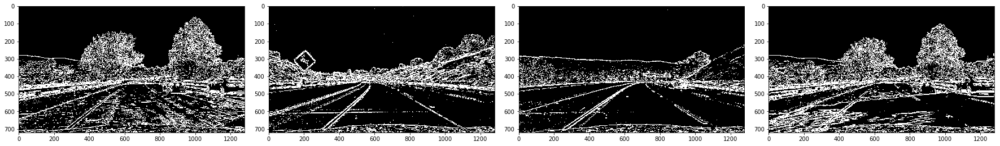

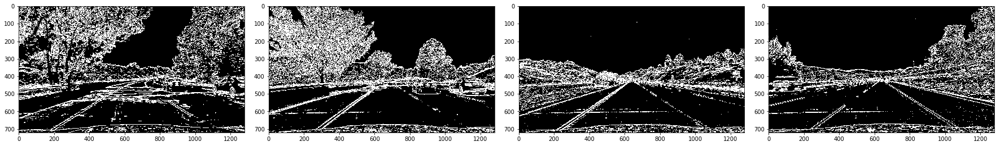

In [15]:
def get_r_channel(test_images):
    images = []
    for image in test_images:
       r = image[:,:,0]
       images.append(r)
    return images  
    
r_channel_images = get_r_channel(test_images)  
    
show_plots(r_channel_images,"gray")

r_channel_sobelx_images = getSobel(r_channel_images,'x',(threshold_min,threshold_max))
r_channel_sobely_images = getSobel(r_channel_images,'y',(threshold_min,threshold_max))

show_plots(r_channel_sobelx_images,"gray")
show_plots(r_channel_sobely_images,"gray")

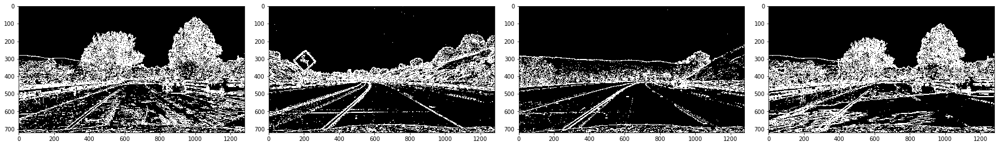

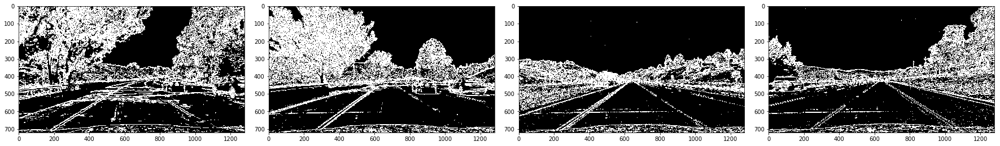

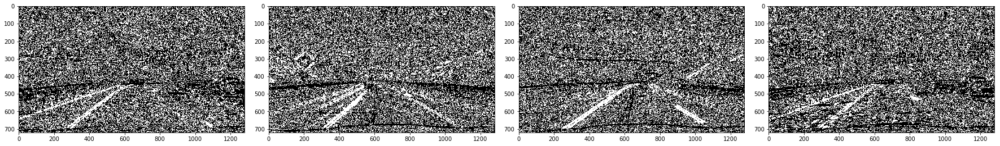

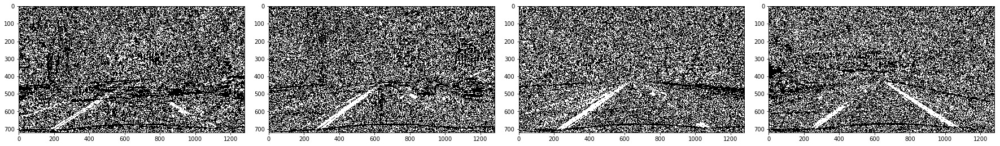

In [16]:
r_channel_mag_binary = mag_thresh(r_channel_images, sobel_kernel=3, mag_thresh=(threshold_min,threshold_max))
show_plots(r_channel_mag_binary,"gray")

r_channel_dir_binary = dir_threshold(r_channel_images, sobel_kernel=15, thresh=(0.7, 1.3))
show_plots(r_channel_dir_binary,"gray") 

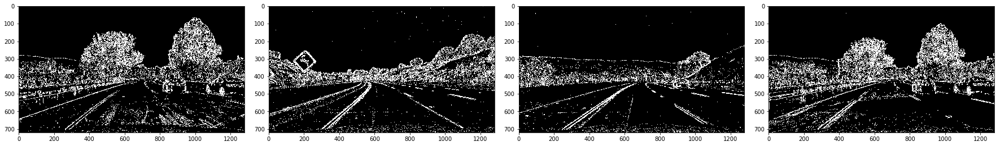

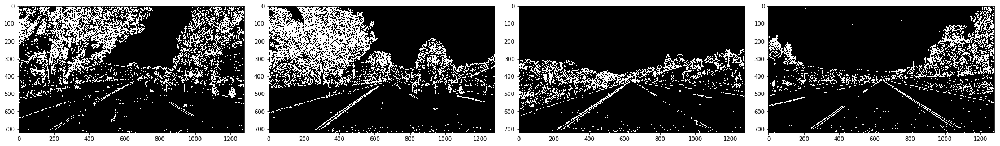

In [17]:
r_channel_combined = get_combined(r_channel_sobelx_images,r_channel_dir_binary)
show_plots(r_channel_combined,"gray") 

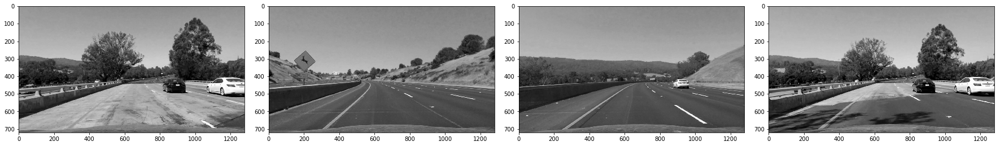

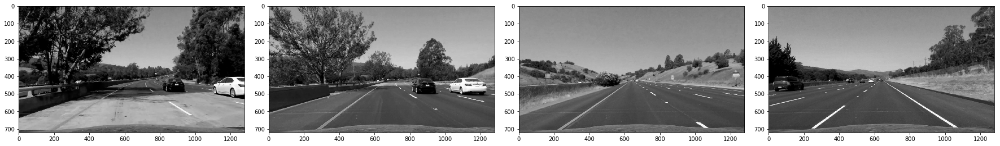

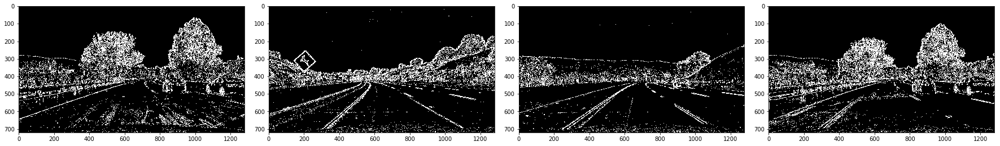

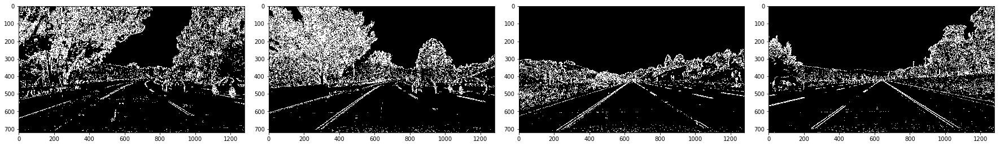

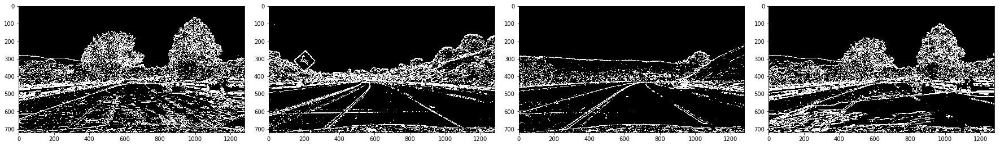

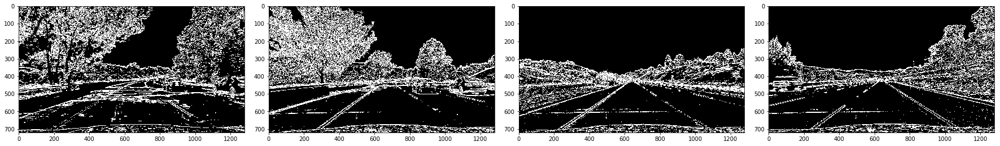

In [18]:
def get_l_channel(test_images):
    images = []
    for image in test_images:
       hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
       l = hls[:,:,1]
       images.append(l)
    return images  
    
l_channel_images = get_l_channel(test_images)  
    
show_plots(l_channel_images,"gray")

l_channel_sobelx_images = getSobel(l_channel_images,'x',(threshold_min,threshold_max))
l_channel_sobely_images = getSobel(l_channel_images,'y',(threshold_min,threshold_max))

show_plots(l_channel_sobelx_images,"gray")
show_plots(l_channel_sobely_images,"gray")

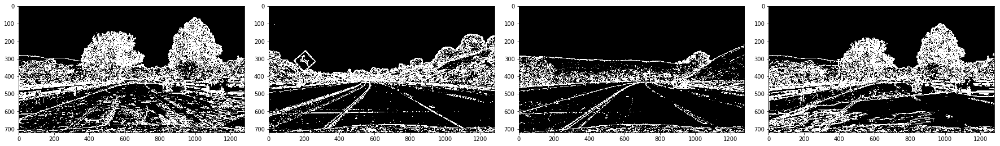

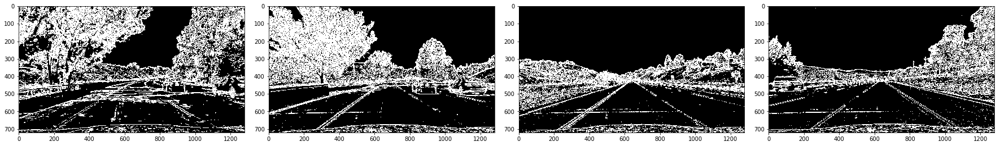

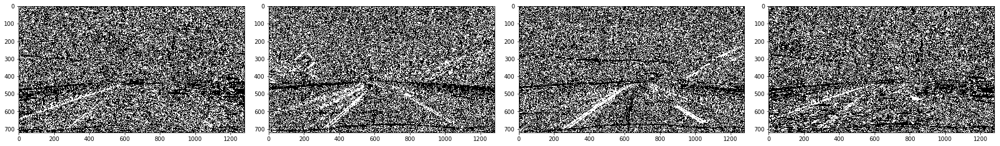

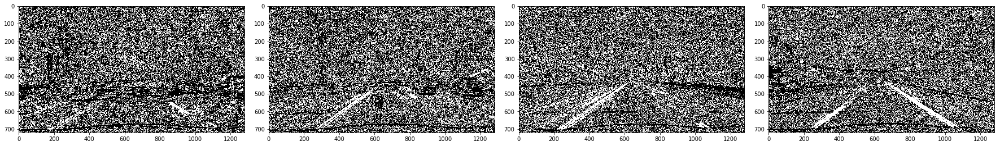

In [19]:
l_channel_mag_binary = mag_thresh(l_channel_images, sobel_kernel=3, mag_thresh=(threshold_min,threshold_max))
show_plots(l_channel_mag_binary,"gray")

l_channel_dir_binary = dir_threshold(l_channel_images, sobel_kernel=15, thresh=(0.7, 1.3))
show_plots(l_channel_dir_binary,"gray") 

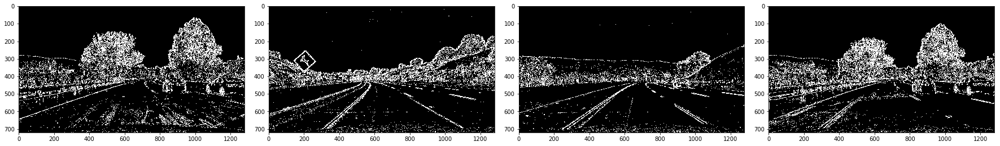

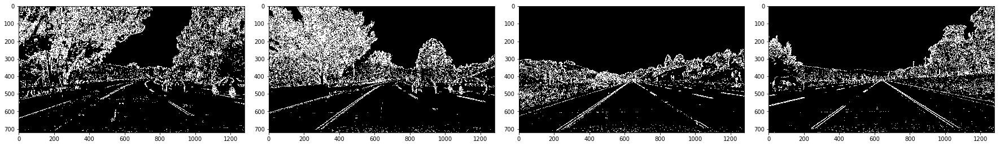

In [20]:
l_channel_combined = get_combined(l_channel_sobelx_images,l_channel_dir_binary)
show_plots(l_channel_combined,"gray") 

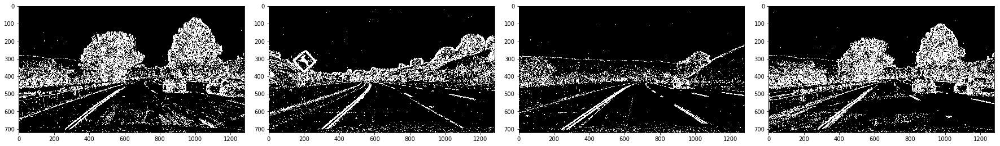

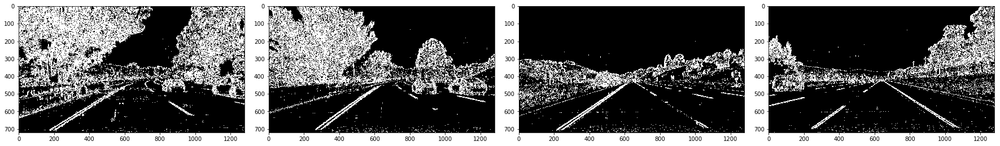

In [21]:

def get_all_channels_combined(s_channel_combined,l_channel_combined):
    images = []
    for i in range(0,len(s_channel_combined)):
        image = np.zeros_like(combined[0])
        temp = np.add(s_channel_combined[i],l_channel_combined[i])
        image[temp>0] = 1
        images.append(image)
    return images  

all_channel_combined = get_all_channels_combined(s_channel_combined,l_channel_combined)
show_plots(all_channel_combined,"gray") 

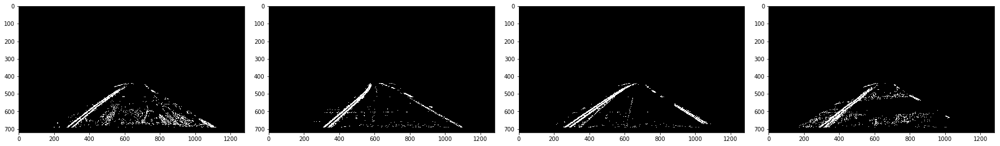

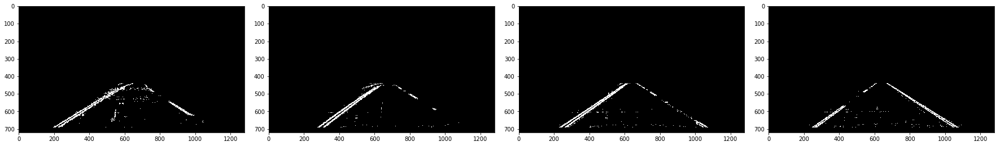

In [22]:
def isolate_region_interest(combined_channel_images):
    images = []
    for image in combined_channel_images:
        height, width = image.shape[0], image.shape[1]
        bl = (width / 2 - 480, height - 30)
        br = (width / 2 + 480, height - 30)
        tl = (width / 2 - 60, height / 2 + 76)
        tr = (width / 2 + 60, height / 2 + 76)

        fit_left = np.polyfit((bl[0], tl[0]), (bl[1], tl[1]), 1)
        fit_right = np.polyfit((br[0], tr[0]), (br[1], tr[1]), 1)
        fit_bottom = np.polyfit((bl[0], br[0]), (bl[1], br[1]), 1)
        fit_top = np.polyfit((tl[0], tr[0]), (tl[1], tr[1]), 1)

        # Find the region inside the lines
        xs, ys = np.meshgrid(np.arange(0, image.shape[1]), np.arange(0, image.shape[0]))
        mask = (ys > (xs * fit_left[0] + fit_left[1])) & \
               (ys > (xs * fit_right[0] + fit_right[1])) & \
               (ys > (xs * fit_top[0] + fit_top[1])) & \
               (ys < (xs * fit_bottom[0] + fit_bottom[1]))
    
        img_window = np.copy(image)
        img_window[mask == False] = 0
        images.append(img_window)
    return images
    
ROI_all_channel_combined = isolate_region_interest(all_channel_combined)
show_plots(ROI_all_channel_combined,"gray") 


### Perspective transform

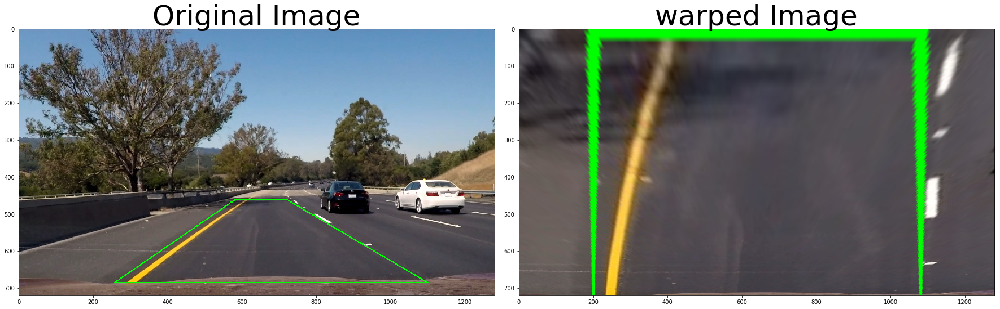

In [39]:

#determine src points
test_image_index = 5
offset =0
img_size = (img.shape[1],img.shape[0])

src = np.float32([[545,473],[800,473],[1259,683],[23,683]])

#determine src points
dst = np.float32([[offset,0], [img_size[0]-offset, 0], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])

src = np.float32([(257, 685), (1100, 685), (583, 460),(720, 460)])
dst = np.float32([(200, 720), (1080, 720), (200, 0), (1080, 0)])

def warp_image(img):
    
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped


warped = warp_image(ROI_all_channel_combined[test_image_index])
Minv = cv2.getPerspectiveTransform(dst, src)
img_copy = np.copy(img)
pts = np.array([(257, 685),(583, 460),(720, 460), (1100, 685) ], np.int32)
pts = pts.reshape((-1,1,2))
cv2.polylines(img_copy,[pts],True,(0,255,0),2)
 
img_copy_warped = warp_image(img_copy)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_copy)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(img_copy_warped)
ax2.set_title('warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 
f.savefig('./writeup_images/warp_confirmation.jpg')



# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 

                                                                                

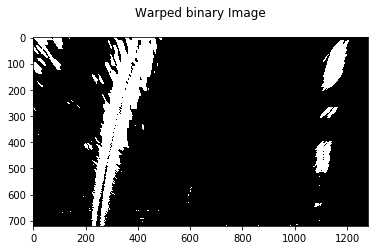

In [40]:
plt.imshow(warped,cmap="gray")
plt.title('Warped binary Image\n')
plt.savefig('./writeup_images/warped_straight_lines.jpg')

### Sliding window search

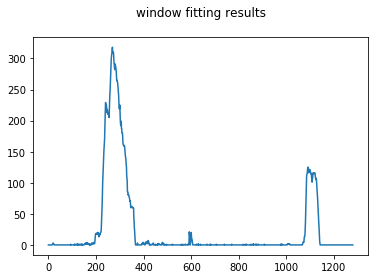

In [22]:
histogram = np.sum(warped [warped .shape[0]//2:,:], axis=0)
plt.plot(histogram)
plt.title('window fitting results\n')

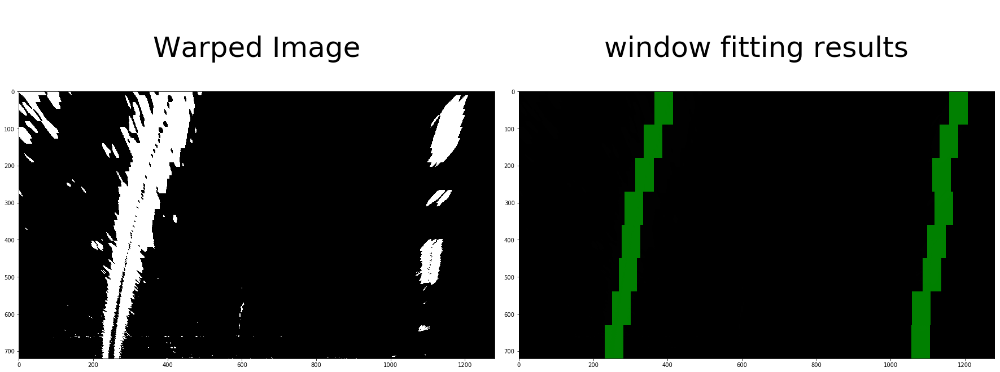

In [23]:
window_width = 50 
window_height = 90 # Break image into 9 vertical layers since image height is 720
margin = 30 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(warped, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/4
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids


window_centroids = find_window_centroids(warped, window_width, window_height, margin)

def window_centers(window_centroids):
    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        return cv2.addWeighted(warpage, 1, template, 0.5, 0.0),l_points,r_points # overlay the orignal road image with window results
 
    # If no window centers found, just display orginal road image
    else:
        return np.array(cv2.merge((warped,warped,warped)),np.uint8),None,None
    
# Display the final results
output,l_points,r_points = window_centers(window_centroids)


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(warped,cmap="gray")
ax1.set_title('\nWarped Image\n', fontsize=50)
ax2.imshow(output)
ax2.set_title('\nwindow fitting results\n', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 
plt.savefig('./writeup_images/color_fit_lines.jpg')

### Measure curvature

In [24]:
#adjust points in left and right curve

        

def pos_from_center(mid_point,leftbase_x,rightbase_x):
    xm_per_pix = 3.7/700
    offset =np.abs(mid_point - (leftbase_x+rightbase_x)/2)
    return offset*xm_per_pix


# def sanity_check(leftx,rightx):
#     height = len(leftx)-1
#     leftx_start = leftx[height]
#     rightx_start = rightx[height]
#     curvature_distance = 600 #np.abs(leftx_start - rightx_start)
#     for i in range(1,len(leftx)):
#         if(np.abs(leftx[i] - rightx[i]) < curvature_distance ):
#               leftx[i] = rightx[i-1] - curvature_distance   
#         if(np.abs(leftx[i] - rightx[i]) < curvature_distance ):
#             rightx[i] = leftx[i-1]  + curvature_distance      
#     return leftx,rightx      



def get_curvature(l_points,r_points,shape):
    
    global previous_left_curverad
    global previous_right_curverad
    global previous_leftx
    global previous_rightx
    
    # Define conversions in x and y from pixels space to meters
    ploty = np.linspace(0, 719, num=shape[0])
    y_eval = np.max(ploty)
    leftx = np.argmax(l_points, axis=1)
    rightx = np.argmax(r_points, axis=1)
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    left_fit = np.polyfit(ploty, leftx, 2)
    right_fit = np.polyfit(ploty, rightx, 2)
    left_fit_x = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fit_x = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad , left_fit_x,right_fit_x,left_fit_cr,right_fit_cr

curvature =  get_curvature(l_points,r_points,warped.shape)
print(curvature[0], 'm', curvature[1], 'm')

1121.33329336 m 242296.727841 m


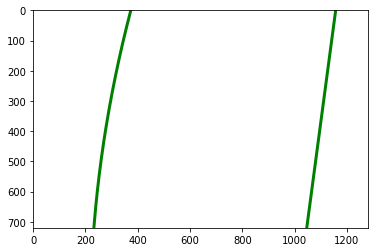

In [25]:
# Plot fitted curve
mark_size = 2
ploty = np.linspace(0, 719, num=720)
# plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
# plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(curvature[2], ploty, color='green', linewidth=3)
plt.plot(curvature[3], ploty, color='green', linewidth=3)
plt.gca().invert_yaxis()

### Overlay and inverse perspective transform

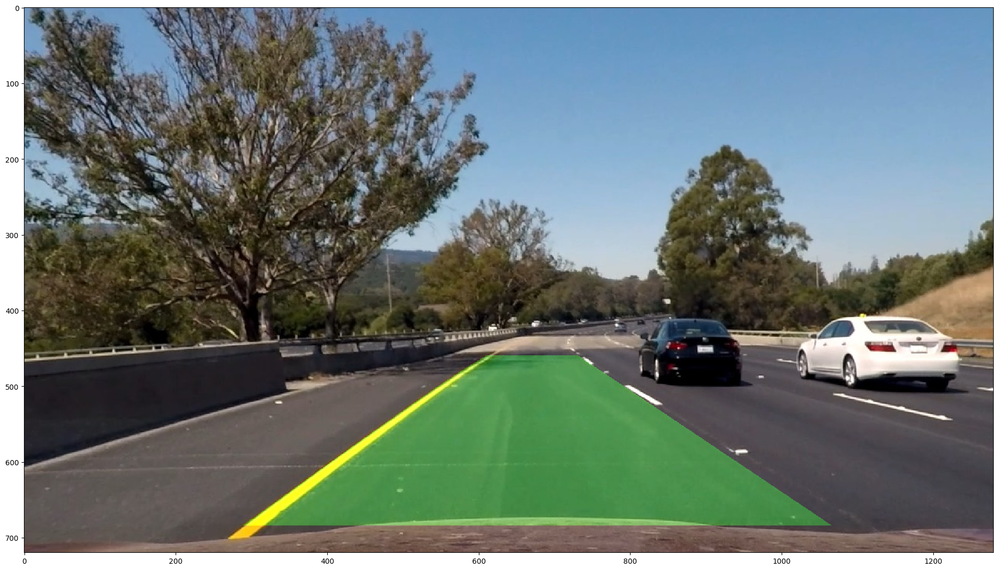

In [33]:


def create_overlay(img,warped,leftx,rightx,Minv):
    ploty = np.linspace(0, 719, num=720)
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)

    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([leftx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([rightx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), [0,255,0])
   




    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (warped.shape[1], warped.shape[0])) 
    # Combine the result with the original image
    return cv2.addWeighted(img, 1, newwarp, 0.3, 0)


result = create_overlay(test_images[test_image_index],warped,curvature[2],curvature[3],Minv)
fig = plt.figure(figsize=(24, 14), dpi=100)
plt.imshow(result)

### Sanity check and smoothing detected lane lines 

In [27]:
 class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None  
        #polynomial coefficients averaged over the last n iterations
        self.best_fit =[] 
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = []
        #y values for detected line pixels
        self.ally = []
        #x coefficients for detected line pixels
        self.allx_coefficient = []
        # x coefficients of the last n fits of the line
        self.recent_x_coeffients = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx_coefficients = None 
     
    def update_lines(self,x):
        self.allx.append(x);
        if(len(self.allx) < 10):
            self.bestx = x
            
        
    def update_coefficients(self,x_coefficient):
        self.allx_coefficient.append(x_coefficient)
        self.current_fit = x_coefficient
        
    def get_last_n_x_values(self,n = 10):
        if(len(self.allx)> n):
            self.recent_xfitted = self.allx[(len(self.allx) - n)-1:]
    
            
    def get_last_n_x_coefficients(self,n = 10):
        if(len(self.allx_coefficient)> n):
            self.recent_x_coefficient = self.allx_coefficient[(len(self.allx_coefficient) - n)-1:]        
            
    def get_average_n_x_values(self,n = 10):
        if(len(self.recent_xfitted) > n):
            temp = self.recent_xfitted[0]
            for i in range(1,n) :
                temp = np.add(temp,self.recent_xfitted[i])
            self.bestx = temp/n 
        
    
    def get_average_n_x_coefficients(self,n = 10):
        if(len(self.recent_x_coeffients) > n):
            temp = self.recent_x_coeffients[0]
            for i in range(1,n) :
                temp = np.add(temp,self.recent_x_coeffients[i])
            self.bestx_coefficients = temp/n 
        
    def set_radius_of_curvature(self,curvature):
        self.radius_of_curvature = curvature
        
    def set_center_position(self,center_position):  
        self.line_base_pos = center_position
        
    def get_coefficient_difference(self):  
        diff = np.subtract(self.current_fit,self.recent_x_coefficient[len(self.recent_x_coefficient)-2])
        diff = np.abs(diff)
        self.diff = diff
        
    def remove_recent_line(self):
        if len(self.allx) > 0:
            self.allx = self.allx[:-1]
            self.allx_coefficient = self.allx_coefficient[:-1]
            

def get_average_x_values(left_line,right_line,n=10):
    left_line.remove_recent_line()
    right_line.remove_recent_line() 
    left_line.get_last_n_x_values(10)
    left_line.get_average_n_x_values(10)
    right_line.get_last_n_x_values(10)
    right_line.get_average_n_x_values(10)
    
    
               
        
def sanitycheck(left_line,right_line):
   
    
    last_index = len(left_line.allx) - 1
    left_curvature = left_line.allx[last_index]
    right_curvature = right_line.allx[last_index]
    

    abs_diff_1 = np.abs(np.subtract(left_line.current_fit[0],right_line.current_fit[0]))
    abs_diff_2 = np.abs(np.subtract(left_line.current_fit[1],right_line.current_fit[1]))
    abs_diff_3 = np.abs(np.subtract(left_line.current_fit[2],right_line.current_fit[2]))
  
    limit = 10.0
    if(abs_diff_1 > limit  or abs_diff_2 > limit  or abs_diff_3 > limit ):
        if(len(left_line.allx) > 0):
            get_average_x_values(left_line,right_line,10)
            left_curvature = left_line.bestx
            right_curvature = right_line.bestx
        return left_curvature,right_curvature
        
    if(np.abs(np.subtract(left_line.radius_of_curvature,right_line.radius_of_curvature)) > 2000):
        get_average_x_values(left_line,right_line,10)
        left_curvature = left_line.bestx
        right_curvature = right_line.bestx
        return left_curvature,right_curvature
    
    if(len(left_line.allx) > 0):
        for i in range(0,len(left_line.allx[last_index])):
            if(np.abs(np.subtract(left_line.allx[last_index][i],right_line.allx[last_index][i])) < 700):
                get_average_x_values(left_line,right_line,10)
                left_curvature = left_line.bestx
                right_curvature = right_line.bestx
                return left_curvature,right_curvature
            
    if(left_line.line_base_pos > 0.30 or right_line.line_base_pos > 0.30):
        get_average_x_values(left_line,right_line,10)
        left_curvature = left_line.bestx
        right_curvature = right_line.bestx
        return left_curvature,right_curvature
    return left_curvature,right_curvature

    
    
        

### Pipeline

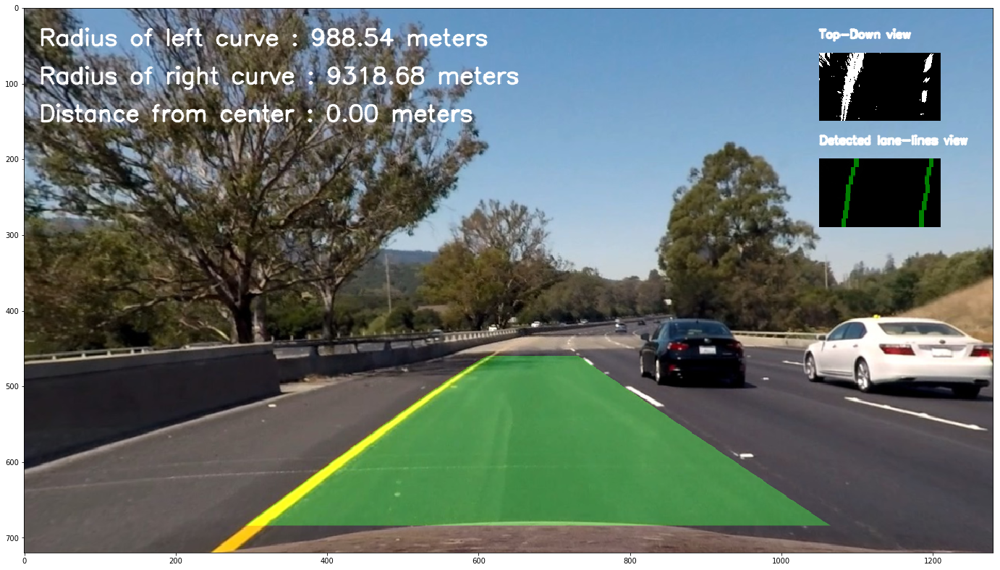

In [35]:

left_line = Line()
right_line = Line()

def process_image(i):
    #gray
    i = np.copy(i)
    i = cv2.undistort(i, mtx, dist, None, mtx)
    
#     gray = cv2.cvtColor(i, cv2.COLOR_RGB2GRAY)
#     sobelx_gray = getSobel([gray],'x',(threshold_min,threshold_max))
#     sobely_gray = getSobel([gray],'y',(threshold_min,threshold_max))
#     mag_gray = mag_thresh([gray], sobel_kernel=3, mag_thresh=(threshold_min,threshold_max))
#     dir_gray = dir_threshold([gray], sobel_kernel=15, thresh=(0.7, 1.3)) 
#     combined = get_combined(sobelx_gray,dir_gray)
    

    #s channel
    s = get_s_channel([i])
    sobelx_s = getSobel(s,'x',(threshold_min,threshold_max))
    sobely_s = getSobel(s,'y',(threshold_min,threshold_max))
    mag_s = mag_thresh(s, sobel_kernel=3, mag_thresh=(threshold_min,threshold_max))
    dir_s = dir_threshold(s, sobel_kernel=15, thresh=(0.7, 1.3))
    combined_s = get_combined(sobelx_s,dir_s)
    
    
    #r channel
#     r = get_r_channel([i])
#     sobelx_r = getSobel(r,'x',(threshold_min,threshold_max))
#     sobely_r = getSobel(r,'y',(threshold_min,threshold_max))
#     mag_r = mag_thresh(r, sobel_kernel=3, mag_thresh=(threshold_min,threshold_max))
#     dir_r = dir_threshold(r, sobel_kernel=15, thresh=(0.7, 1.3))
#     combined_r = get_combined(sobelx_r,dir_r)
    
    #l channel
    l = get_l_channel([i])
    sobelx_l = getSobel(l,'x',(threshold_min,threshold_max))
    sobely_l = getSobel(l,'y',(threshold_min,threshold_max))
    mag_l = mag_thresh(l, sobel_kernel=3, mag_thresh=(threshold_min,threshold_max))
    dir_l = dir_threshold(l, sobel_kernel=15, thresh=(0.7, 1.3))
    combined_l = get_combined(sobelx_l,dir_l)
    
    #combine channels
    all_combined = get_all_channels_combined(combined_s,combined_l)

    ROI_all_combined = isolate_region_interest(all_combined)
    
    
    warped = warp_image(ROI_all_combined[0])
    window_centroids = find_window_centroids(warped, 50, 90, 30)
    output,l_points,r_points = window_centers(window_centroids)
    
    curvature = get_curvature(l_points,r_points,warped.shape)
    
    
    
    global left_line
    global right_line
    
    left_line.update_lines(curvature[2])
    right_line.update_lines(curvature[3])
    
    left_line.update_coefficients(curvature[4])
    right_line.update_coefficients(curvature[5])
    
    
    left_line.set_radius_of_curvature(curvature[0])
    right_line.set_radius_of_curvature(curvature[1])
    
    offset = pos_from_center(i.shape[1]/2,curvature[2][i.shape[0]-1],curvature[3][i.shape[0]-1])
    
    left_line.set_center_position(offset)
    right_line.set_center_position(offset)
    
    left_curve,right_curve = sanitycheck(left_line,right_line)
   
    result = create_overlay(i,warped,left_curve,right_curve,Minv)
    
    #Information string
    height = result.shape[0]-1
    curvature_string_left = "Radius of left curve : {0:.2f} meters".format(curvature[0])
    curvature_string_right = "Radius of right curve : {0:.2f} meters".format(curvature[1])
    location_string = "Distance from center : {0:.2f} meters".format(offset)
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,curvature_string_left,(20,50), font, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(result,curvature_string_right,(20,100), font, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(result,location_string,(20,150), font, 1,(255,255,255),2,cv2.LINE_AA)
    
    #add overlay
    small_warped = cv2.resize(warped,(160,90))
    y_position = 60
    x_position = 1050
    small_width = int(result.shape[1] * 0.125)
    small_height = int(result.shape[0]* 0.125)
    small_warped_copy = np.zeros_like(small_warped)
    small_warped_copy[small_warped > 0] = 255
    result[y_position:small_height+y_position,x_position:x_position+small_width,0 ] = small_warped_copy
    result[y_position:small_height+y_position,x_position:x_position+small_width,1 ] = small_warped_copy
    result[y_position:small_height+y_position,x_position:x_position+small_width,2 ] = small_warped_copy
    cv2.putText(result,"Top-Down view",(x_position,40), font, 0.5,(255,255,255),2,cv2.LINE_AA)
    
    small_output = cv2.resize(output,(160,90))
    y_position = 200 
    x_position = 1050
    small_width = int(result.shape[1] * 0.125)
    small_height = int(result.shape[0]* 0.125)
    small_output_copy = np.zeros_like(small_output)
    small_output_copy[small_output > 0] = 255
    result[y_position:small_height+y_position,x_position:x_position+small_width] = small_output
    
    cv2.putText(result,"Detected lane-lines view",(x_position,180), font, 0.5,(255,255,255),2,cv2.LINE_AA)
    
    
    
    return result
fig = plt.figure(figsize=(24, 14))
plt.imshow(process_image(test_images[test_image_index]))
plt.savefig('./writeup_images/example_output.jpg')



### Process project video

In [42]:

from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [30]:
advanced_lane_line_test_1 = 'processed_project_video.mp4'
clip1_1 = VideoFileClip("project_video.mp4")
white_clip = clip1_1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(advanced_lane_line_test_1, audio=False)

[MoviePy] >>>> Building video processed_project_video.mp4
[MoviePy] Writing video processed_project_video.mp4


100%|█████████▉| 1260/1261 [11:49<00:00,  1.80it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: processed_project_video.mp4 

CPU times: user 9min 18s, sys: 2min 42s, total: 12min
Wall time: 11min 49s


In [31]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(advanced_lane_line_test_1))

In [44]:
clip = VideoFileClip("processed_project_video.mp4")
clip2=clip.resize(width=clip.w//2,height=clip.h//2).speedx(2)
clip2.write_gif("processed_project_video.gif",program= 'ffmpeg')


[MoviePy] >>>> Building file processed_project_video.gif
[MoviePy] Generating GIF frames...


100%|█████████▉| 630/631 [00:13<00:00, 47.20it/s]


[MoviePy] >>>> File processed_project_video.gif is ready !